# **1. Perkenalan Dataset**


Tahap pertama, Anda harus mencari dan menggunakan dataset **tanpa label** dengan ketentuan sebagai berikut:

1. **Sumber Dataset**:  
   Dataset dapat diperoleh dari berbagai sumber, seperti public repositories (*Kaggle*, *UCI ML Repository*, *Open Data*) atau data primer yang Anda kumpulkan sendiri.
   
2. **Ketentuan Dataset**:
   - **Tanpa label**: Dataset tidak boleh memiliki label atau kelas.
   - **Jumlah Baris**: Minimal 1000 baris untuk memastikan dataset cukup besar untuk analisis yang bermakna.
   - **Tipe Data**: Harus mengandung data **kategorikal** dan **numerikal**.
     - *Kategorikal*: Misalnya jenis kelamin, kategori produk.
     - *Numerikal*: Misalnya usia, pendapatan, harga.

3. **Pembatasan**:  
   Dataset yang sudah digunakan dalam latihan clustering (seperti customer segmentation) tidak boleh digunakan.

# **2. Import Library**

Pada tahap ini, Anda perlu mengimpor beberapa pustaka (library) Python yang dibutuhkan untuk analisis data dan pembangunan model machine learning.

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, DBSCAN
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from datetime import datetime
from sklearn.datasets import make_blobs
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from scipy.stats import chi2_contingency, pointbiserialr
import warnings
import sys
import os

# **3. Memuat Dataset**

Pada tahap ini, Anda perlu memuat dataset ke dalam notebook. Jika dataset dalam format CSV, Anda bisa menggunakan pustaka pandas untuk membacanya. Pastikan untuk mengecek beberapa baris awal dataset untuk memahami strukturnya dan memastikan data telah dimuat dengan benar.

Jika dataset berada di Google Drive, pastikan Anda menghubungkan Google Drive ke Colab terlebih dahulu. Setelah dataset berhasil dimuat, langkah berikutnya adalah memeriksa kesesuaian data dan siap untuk dianalisis lebih lanjut.

In [6]:
from google.colab import files
uploaded = files.upload()  # Upload file secara manual

load_marketing_campaign = pd.read_csv("marketing_campaign.csv", sep='\t')
load_marketing_campaign.head()

Saving marketing_campaign.csv to marketing_campaign.csv


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [7]:
#Membuat Dataframe
df = pd.DataFrame(load_marketing_campaign)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i


- **ID**: Identifikasi unik pelanggan  
- **Year_Birth**: Tahun kelahiran pelanggan  
- **Education**: Tingkat pendidikan pelanggan  
- **Marital_Status**: Status pernikahan pelanggan  
- **Income**: Pendapatan tahunan rumah tangga pelanggan  
- **Kidhome**: Jumlah anak kecil dalam rumah tangga pelanggan  
- **Teenhome**: Jumlah remaja dalam rumah tangga pelanggan  
- **Dt_Customer**: Tanggal pendaftaran pelanggan di perusahaan  
- **Recency**: Jumlah hari sejak pembelian terakhir pelanggan  
- **Complain**: 1 jika pelanggan mengajukan keluhan dalam 2 tahun terakhir, 0 jika tidak  

- **MntWines**: Jumlah yang dibelanjakan untuk anggur dalam 2 tahun terakhir  
- **MntFruits**: Jumlah yang dibelanjakan untuk buah-buahan dalam 2 tahun terakhir  
- **MntMeatProducts**: Jumlah yang dibelanjakan untuk produk daging dalam 2 tahun terakhir  
- **MntFishProducts**: Jumlah yang dibelanjakan untuk produk ikan dalam 2 tahun terakhir  
- **MntSweetProducts**: Jumlah yang dibelanjakan untuk permen dalam 2 tahun terakhir  
- **MntGoldProds**: Jumlah yang dibelanjakan untuk emas dalam 2 tahun terakhir  

- **NumDealsPurchases**: Jumlah pembelian yang dilakukan dengan diskon  
- **AcceptedCmp1**: 1 jika pelanggan menerima tawaran pada kampanye pertama, 0 jika tidak  
- **AcceptedCmp2**: 1 jika pelanggan menerima tawaran pada kampanye kedua, 0 jika tidak  
- **AcceptedCmp3**: 1 jika pelanggan menerima tawaran pada kampanye ketiga, 0 jika tidak  
- **AcceptedCmp4**: 1 jika pelanggan menerima tawaran pada kampanye keempat, 0 jika tidak  
- **AcceptedCmp5**: 1 jika pelanggan menerima tawaran pada kampanye kelima, 0 jika tidak  
- **Response**: 1 jika pelanggan menerima tawaran pada kampanye terakhir, 0 jika tidak  

**Tempat**  
- **NumWebPurchases**: Jumlah pembelian yang dilakukan melalui situs web perusahaan  
- **NumCatalogPurchases**: Jumlah pembelian yang dilakukan menggunakan katalog  
- **NumStorePurchases**: Jumlah pembelian yang dilakukan langsung di toko  
- **NumWebVisitsMonth**: Jumlah kunjungan ke situs web perusahaan dalam sebulan terakhir  

# **4. Exploratory Data Analysis (EDA)**

Pada tahap ini, Anda akan melakukan **Exploratory Data Analysis (EDA)** untuk memahami karakteristik dataset. EDA bertujuan untuk:

1. **Memahami Struktur Data**
   - Tinjau jumlah baris dan kolom dalam dataset.  
   - Tinjau jenis data di setiap kolom (numerikal atau kategorikal).

2. **Menangani Data yang Hilang**  
   - Identifikasi dan analisis data yang hilang (*missing values*). Tentukan langkah-langkah yang diperlukan untuk menangani data yang hilang, seperti pengisian atau penghapusan data tersebut.

3. **Analisis Distribusi dan Korelasi**  
   - Analisis distribusi variabel numerik dengan statistik deskriptif dan visualisasi seperti histogram atau boxplot.  
   - Periksa hubungan antara variabel menggunakan matriks korelasi atau scatter plot.

4. **Visualisasi Data**  
   - Buat visualisasi dasar seperti grafik distribusi dan diagram batang untuk variabel kategorikal.  
   - Gunakan heatmap atau pairplot untuk menganalisis korelasi antar variabel.

Tujuan dari EDA adalah untuk memperoleh wawasan awal yang mendalam mengenai data dan menentukan langkah selanjutnya dalam analisis atau pemodelan.

1. Memahami Struktur Data

In [8]:
# Tinjau jumlah baris dan kolom dalam dataset
print("Jumlah baris dan kolom:", df.shape)

Jumlah baris dan kolom: (2240, 29)


In [9]:
# Tinjau jenis data di setiap kolom
print("\nTipe data per kolom:")
print(df.dtypes)


Tipe data per kolom:
ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object


In [10]:
# Mengubah tipe data int menjadi float untuk konsistensi
df = df.astype({col: 'float64' for col in df.select_dtypes(include=['int32', 'int64']).columns})

# Check Tipe data
df.dtypes

,0
ID,float64
Year_Birth,float64
Education,object
Marital_Status,object
Income,float64
Kidhome,float64
Teenhome,float64
Dt_Customer,object
Recency,float64
MntWines,float64


In [11]:
#Mengubah informasi Year_Birth menjadi Age
df['Age'] = 2024 - df['Year_Birth']

In [12]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
0,5524.0,1957.0,Graduation,Single,58138.0,0.0,0.0,04-09-2012,58.0,635.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,1.0,67.0
1,2174.0,1954.0,Graduation,Single,46344.0,1.0,1.0,08-03-2014,38.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,70.0
2,4141.0,1965.0,Graduation,Together,71613.0,0.0,0.0,21-08-2013,26.0,426.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,59.0
3,6182.0,1984.0,Graduation,Together,26646.0,1.0,0.0,10-02-2014,26.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,40.0
4,5324.0,1981.0,PhD,Married,58293.0,1.0,0.0,19-01-2014,94.0,173.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,43.0


In [13]:
# Mengubah Dt_Customer dari tipe object ke datetime
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], dayfirst=True)

# Memeriksa apakah perubahan berhasil
print(df['Dt_Customer'].dtype)


datetime64[ns]


In [14]:
#Mengubah tanggal pendaftaran menjadi data lama pelanggan sudah berlangganan
df['Customer_Since'] = 2024 - df['Dt_Customer'].dt.year  # Calculate how long they have been a customer

In [15]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Customer_Since
0,5524.0,1957.0,Graduation,Single,58138.0,0.0,0.0,2012-09-04,58.0,635.0,...,0.0,0.0,0.0,0.0,0.0,3.0,11.0,1.0,67.0,12
1,2174.0,1954.0,Graduation,Single,46344.0,1.0,1.0,2014-03-08,38.0,11.0,...,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,70.0,10
2,4141.0,1965.0,Graduation,Together,71613.0,0.0,0.0,2013-08-21,26.0,426.0,...,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,59.0,11
3,6182.0,1984.0,Graduation,Together,26646.0,1.0,0.0,2014-02-10,26.0,11.0,...,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,40.0,10
4,5324.0,1981.0,PhD,Married,58293.0,1.0,0.0,2014-01-19,94.0,173.0,...,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,43.0,10


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   float64       
 1   Year_Birth           2240 non-null   float64       
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   float64       
 6   Teenhome             2240 non-null   float64       
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   float64       
 9   MntWines             2240 non-null   float64       
 10  MntFruits            2240 non-null   float64       
 11  MntMeatProducts      2240 non-null   float64       
 12  MntFishProducts      2240 non-null   float64       
 13  MntSweetProducts     2240 non-nul

In [17]:
# Mengubah Customer_Since dari int64 ke float64
df['Customer_Since'] = df['Customer_Since'].astype('float64')

# Memeriksa apakah perubahan berhasil
print(df['Customer_Since'].dtype)


float64


In [18]:
# Memisahkan kolom numerikal dan kategorikal
numerical_columns = df.select_dtypes(include=['float64']).columns
categorical_columns = df.select_dtypes(include=['object']).columns

print(f"Kolom numerikal: {list(numerical_columns)}")
print(f"Kolom kategorikal: {list(categorical_columns)}")

Kolom numerikal: ['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response', 'Age', 'Customer_Since']
Kolom kategorikal: ['Education', 'Marital_Status']


2. Menangani Data yang Hilang

In [19]:
# Identifikasi data yang hilang
missing_values = df.isnull().sum()
print("\nJumlah data yang hilang per kolom:")
print(missing_values)


Jumlah data yang hilang per kolom:
ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
Age                     0
Customer_Since          0
dtype: int64


Pada kolom income terdapat 24 missing value. Maka akan dicek apakah income memiliki outlier atau tidak untuk memustukkan penggunaan mean atau median


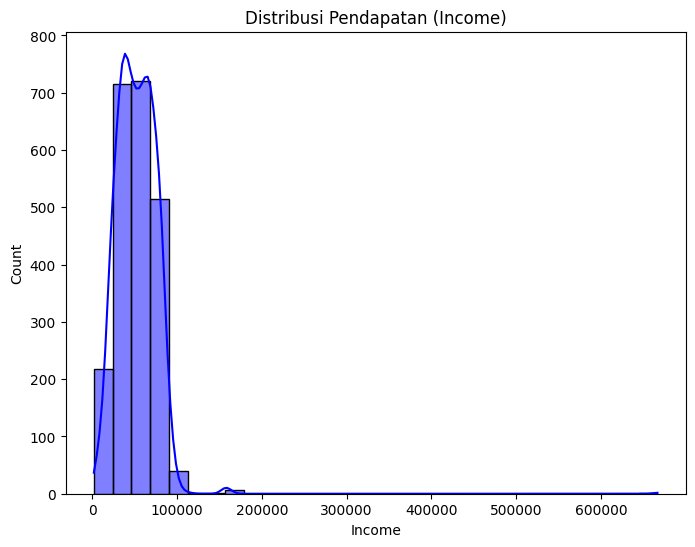

In [20]:
# Memeriksa distribusi kolom Income
plt.figure(figsize=(8, 6))
sns.histplot(df['Income'].dropna(), bins=30, kde=True, color='blue')
plt.title('Distribusi Pendapatan (Income)')
plt.show()

In [21]:
# Menghitung jumlah data dengan income lebih dari 15000
jumlah_data = df[df['Income'] > 150000].shape[0]

print(f'Jumlah data dengan income lebih dari 15000: {jumlah_data}')

Jumlah data dengan income lebih dari 15000: 8


Ternyata grafik menunjukkan bahwa ada outlier dengan jumlah 8 data maka akan lebih baik jika missing value diisi menggunakan median

In [22]:
#Mengisi Missing value dengan median
median_income = df['Income'].median()
df['Income'].fillna(median_income, inplace=True)
print("Missing value pada kolom 'Income' telah diisi dengan mean:", median_income)

Missing value pada kolom 'Income' telah diisi dengan mean: 51381.5


<ipython-input-22-ab6102f9cf18>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Income'].fillna(median_income, inplace=True)


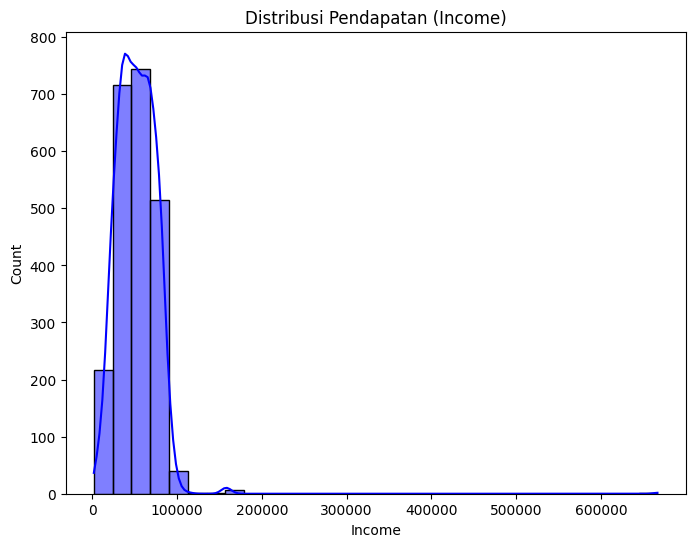

In [23]:
# Memeriksa distribusi kolom Income setelah diisi missing value
plt.figure(figsize=(8, 6))
sns.histplot(df['Income'].dropna(), bins=30, kde=True, color='blue')
plt.title('Distribusi Pendapatan (Income)')
plt.show()

Dari sini terlihat bahwa diagram lebih normal

3. Analisis Distribusi dan Kolerasi

In [24]:
# Analisis distribusi variabel numerik dengan statistik deskriptif
print("\nStatistik deskriptif untuk variabel numerik:")
print(df.describe())


Statistik deskriptif untuk variabel numerik:
                 ID   Year_Birth         Income      Kidhome     Teenhome  \
count   2240.000000  2240.000000    2240.000000  2240.000000  2240.000000   
mean    5592.159821  1968.805804   52237.975446     0.444196     0.506250   
min        0.000000  1893.000000    1730.000000     0.000000     0.000000   
25%     2828.250000  1959.000000   35538.750000     0.000000     0.000000   
50%     5458.500000  1970.000000   51381.500000     0.000000     0.000000   
75%     8427.750000  1977.000000   68289.750000     1.000000     1.000000   
max    11191.000000  1996.000000  666666.000000     2.000000     2.000000   
std     3246.662198    11.984069   25037.955891     0.538398     0.544538   

                         Dt_Customer      Recency     MntWines    MntFruits  \
count                           2240  2240.000000  2240.000000  2240.000000   
mean   2013-07-10 10:01:42.857142784    49.109375   303.935714    26.302232   
min              2012-0

In [25]:
# Menampilkan statistik deskriptif dari dataset untuk kolom numerik
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Customer_Since
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000,2240.000000,2240.000000
mean,5592.159821,1968.805804,52237.975446,0.444196,0.506250,2013-07-10 10:01:42.857142784,49.109375,303.935714,26.302232,166.950000,...,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107,55.194196,10.971875
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,2012-07-30 00:00:00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,28.000000,10.000000
25%,2828.250000,1959.000000,35538.750000,0.000000,0.000000,2013-01-16 00:00:00,24.000000,23.750000,1.000000,16.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,47.000000,11.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,2013-07-08 12:00:00,49.000000,173.500000,8.000000,67.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,54.000000,11.000000
75%,8427.750000,1977.000000,68289.750000,1.000000,1.000000,2013-12-30 06:00:00,74.000000,504.250000,33.000000,232.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000,65.000000,11.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,2014-06-29 00:00:00,99.000000,1493.000000,199.000000,1725.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000,131.000000,12.000000
std,3246.662198,11.984069,25037.955891,0.538398,0.544538,NaN,28.962453,336.597393,39.773434,225.715373,...,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274,11.984069,0.684554


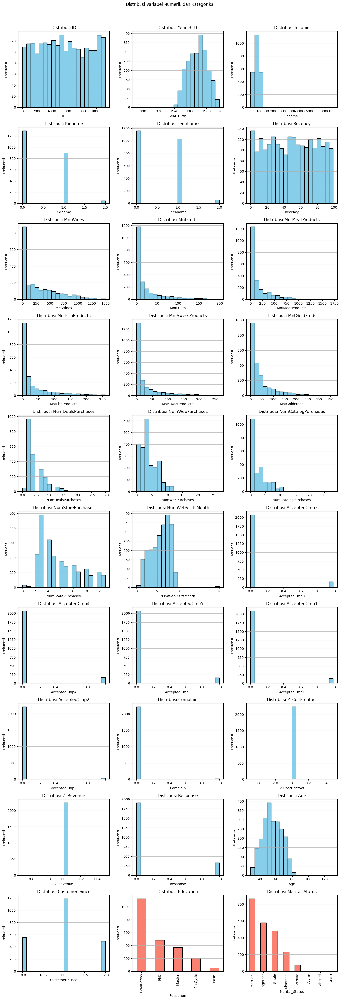

In [26]:
# Memilih kolom numerik dan kategorikal
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

# Menghitung jumlah subplot yang diperlukan
num_numerical = len(numerical_columns)
num_categorical = len(categorical_columns)
total_plots = num_numerical + num_categorical
num_rows = int(np.ceil(total_plots / 3))  # Menyesuaikan jumlah baris

# Membuat figure dan ukuran berdasarkan total plot
plt.figure(figsize=(14, num_rows * 4))

# Plot untuk setiap kolom numerik
for i, column in enumerate(numerical_columns):
    plt.subplot(num_rows, 3, i + 1)
    plt.hist(df[column], bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Distribusi {column}')
    plt.xlabel(column)
    plt.ylabel('Frekuensi')
    plt.grid(axis='y', alpha=0.75)

# Plot untuk setiap kolom kategorikal
for j, column in enumerate(categorical_columns):
    plt.subplot(num_rows, 3, num_numerical + j + 1)
    df[column].value_counts().plot(kind='bar', color='salmon', edgecolor='black')
    plt.title(f'Distribusi {column}')
    plt.xlabel(column)
    plt.ylabel('Frekuensi')
    plt.grid(axis='y', alpha=0.75)

# Pengaturan layout dan judul keseluruhan
plt.tight_layout()
plt.suptitle('Distribusi Variabel Numerik dan Kategorikal', y=1.02)
plt.show()

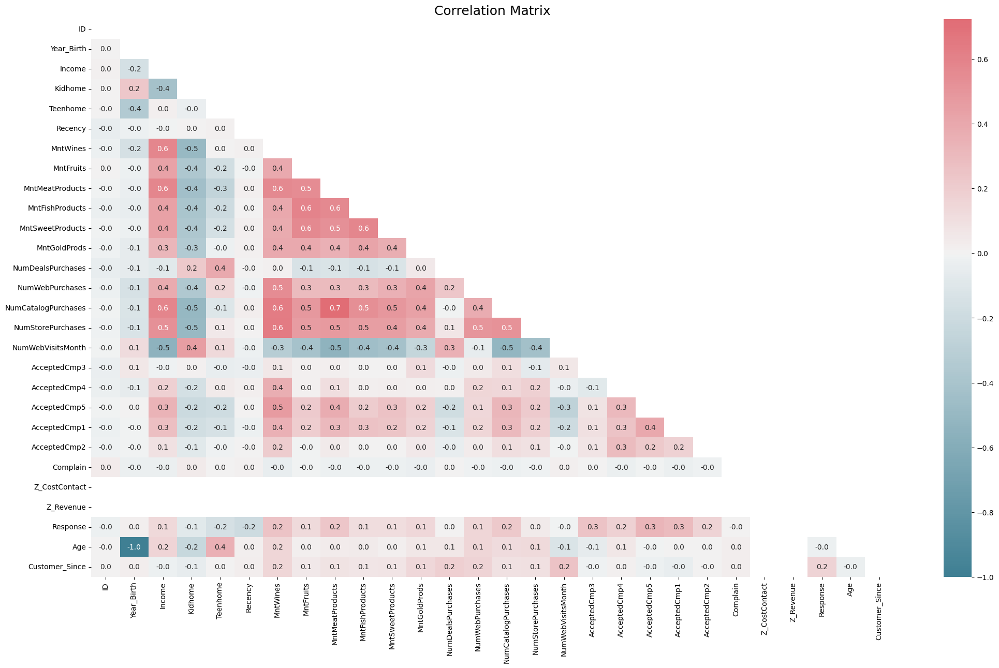

In [34]:
#Encode kolom kategorikal
df_encoded = pd.get_dummies(df, columns=['Education', 'Marital_Status'], drop_first=True)
# Daftar kolom yang ingin dianalisis
to_corr = ['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome',
           'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
           'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
           'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
           'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4',
           'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
           'Z_Revenue', 'Response', 'Age', 'Customer_Since']

cmap = sns.diverging_palette(220, 10, as_cmap=True)
matrix = np.triu(df_encoded[to_corr].corr())
plt.figure(figsize=(25, 14))
plt.title('Correlation Matrix', fontsize=18)
sns.heatmap(df_encoded[to_corr].corr(), annot=True,
            fmt='.1f', vmin=-1, center=0, cmap=cmap, mask=matrix)

plt.show()

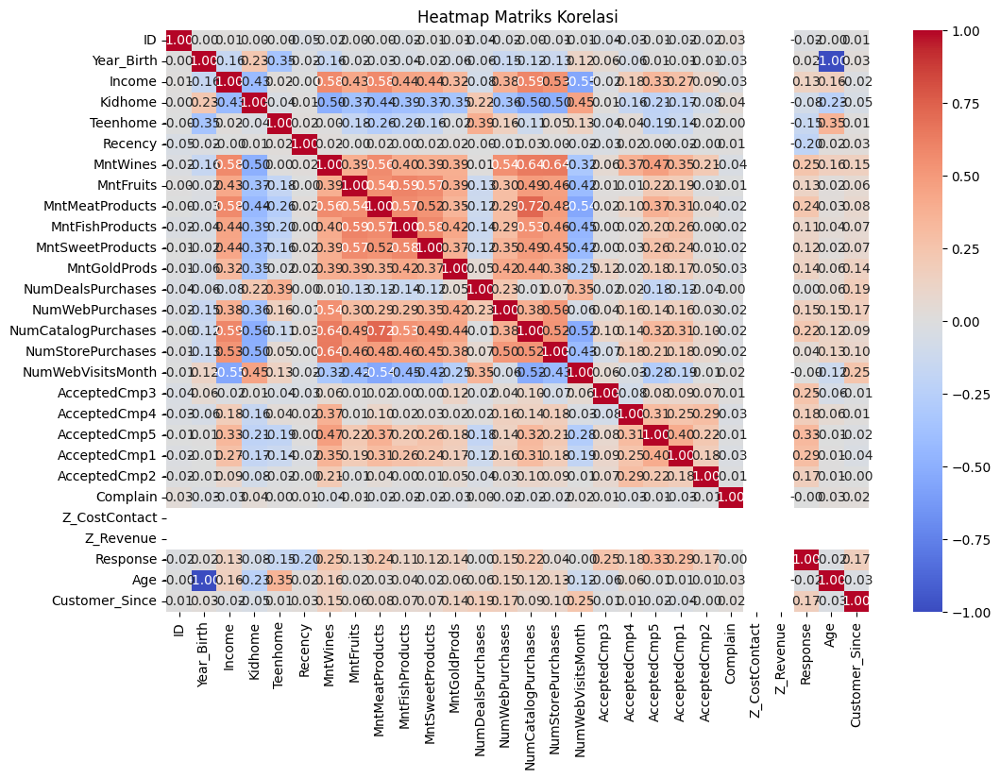

In [35]:
# Memilih hanya kolom numerik dari DataFrame
numerical_columns = df.select_dtypes(include=['float64'])

# Menghitung matriks korelasi hanya untuk kolom numerik
corr_matrix = numerical_columns.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap Matriks Korelasi')
plt.show()


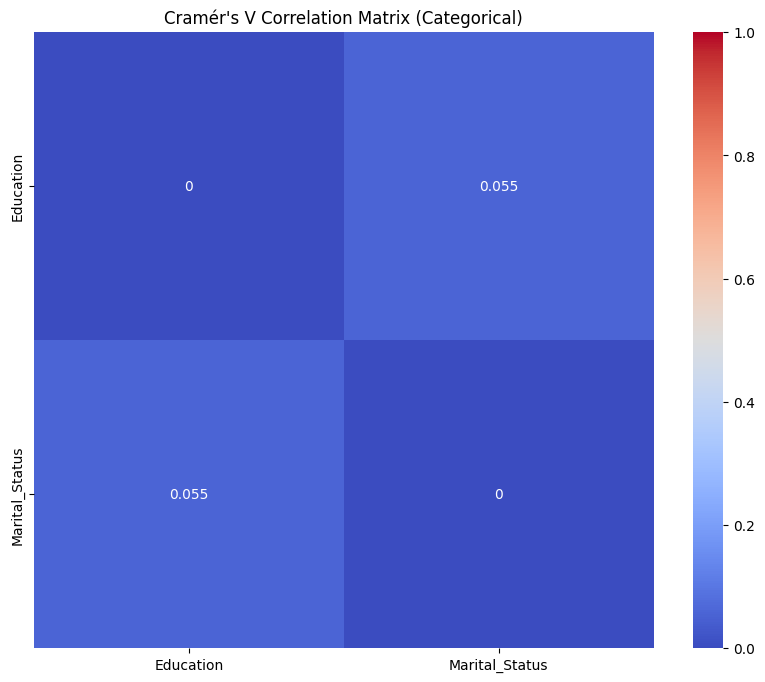

In [39]:
# Fungsi untuk menghitung Cramér's V (korelasi antar kategorikal)
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))

# Matriks korelasi antar kategorikal dengan Cramér's V
cat_corr_matrix = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))),
                               index=categorical_columns, columns=categorical_columns)

for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            cat_corr_matrix.loc[col1, col2] = cramers_v(df[col1], df[col2])

# Plot heatmap untuk korelasi antar kategorikal
plt.figure(figsize=(10, 8))
sns.heatmap(cat_corr_matrix, annot=True, cmap='coolwarm', vmin=0, vmax=1)
plt.title("Cramér's V Correlation Matrix (Categorical)")
plt.show()

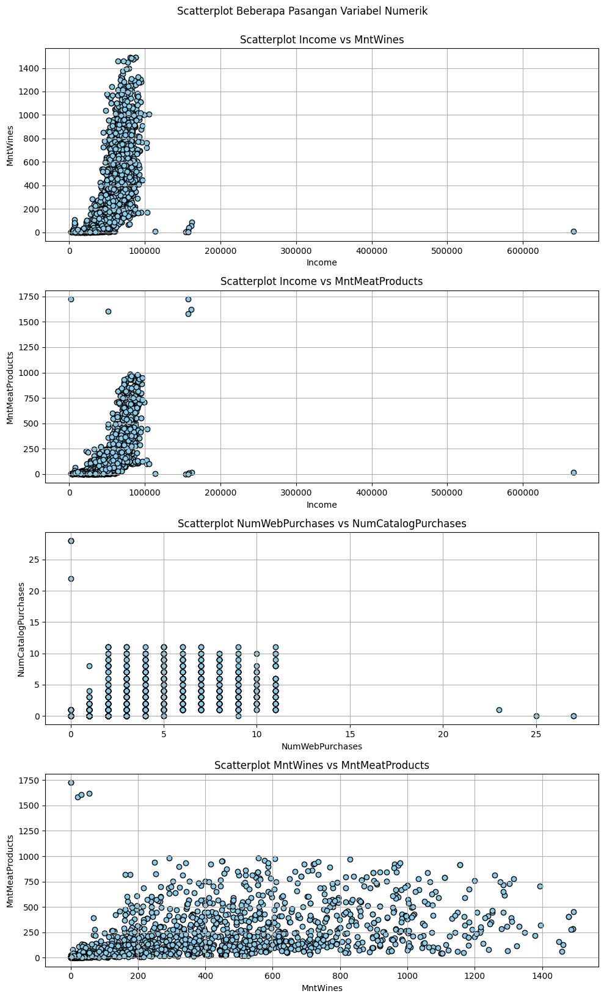

In [40]:
# Kolom numerikal dan kategorikal yang telah kamu sebutkan
numerical_columns = ['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome',
                     'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
                      'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
                      'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
                      'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
                      'Complain', 'Z_CostContact', 'Z_Revenue', 'Response', 'Age']

categorical_columns = ['Education', 'Marital_Status']

# Membuat scatterplot untuk beberapa pasangan kolom numerikal
# Memilih beberapa pasangan variabel numerikal yang relevan
pairs = [('Income', 'MntWines'),
         ('Income', 'MntMeatProducts'),
         ('NumWebPurchases', 'NumCatalogPurchases'),
         ('MntWines', 'MntMeatProducts')]

# Membuat scatterplot untuk pasangan yang dipilih
plt.figure(figsize=(10, len(pairs) * 4))

for i, (col1, col2) in enumerate(pairs):
    plt.subplot(len(pairs), 1, i + 1)
    plt.scatter(df[col1], df[col2], color='skyblue', edgecolor='black')
    plt.title(f'Scatterplot {col1} vs {col2}')
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.grid(True)

plt.tight_layout()  # Menyesuaikan layout agar tidak tumpang tindih
plt.suptitle('Scatterplot Beberapa Pasangan Variabel Numerik', y=1.02)  # Menambahkan judul utama
plt.show()


4. Visualisasi

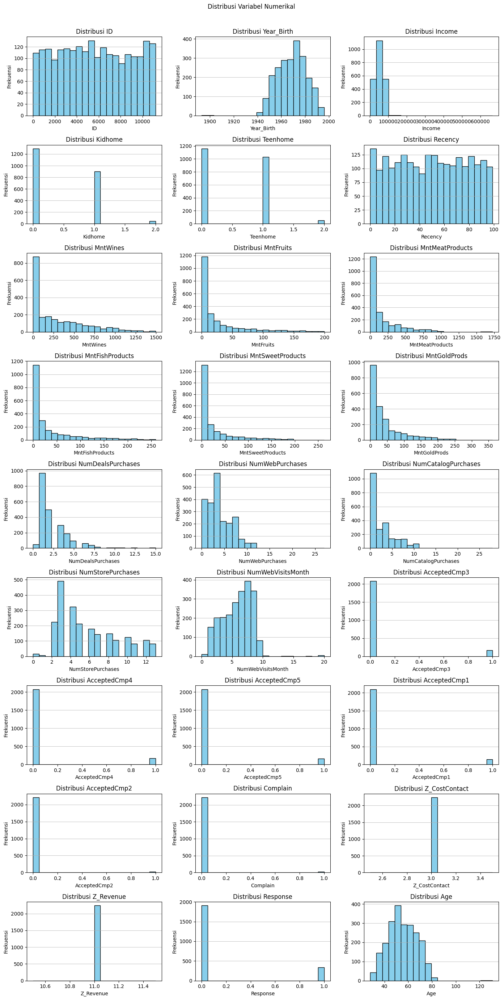

<ipython-input-41-8f7684cb11ce>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')
<ipython-input-41-8f7684cb11ce>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


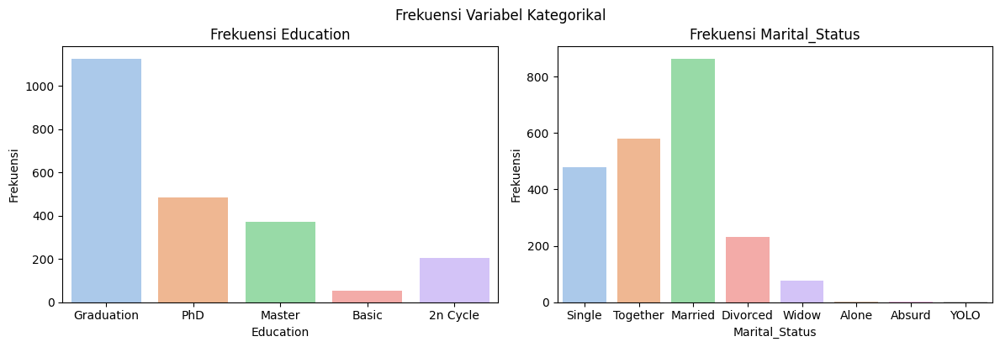

In [41]:
# Memilih kolom numerik
numerical_columns = ['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome',
                     'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
                      'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
                      'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
                      'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
                      'Complain', 'Z_CostContact', 'Z_Revenue', 'Response', 'Age']

# Membatasi jumlah kolom dalam satu baris menjadi 3 untuk tampilan lebih proporsional
num_columns = len(numerical_columns)
num_rows = int(np.ceil(num_columns / 3))  # Mengatur jumlah baris

# Membuat histogram untuk setiap kolom numerikal
plt.figure(figsize=(14, num_rows * 3))  # Mengurangi ukuran gambar
for i, column in enumerate(numerical_columns):
    plt.subplot(num_rows, 3, i + 1)  # Mengatur jumlah subplot, maksimal 3 per baris
    plt.hist(df[column], bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Distribusi {column}')
    plt.xlabel(column)
    plt.ylabel('Frekuensi')
    plt.grid(axis='y', alpha=0.75)

plt.tight_layout()  # Menyesuaikan layout agar tidak tumpang tindih
plt.suptitle('Distribusi Variabel Numerikal', y=1.02)  # Menambahkan judul utama
plt.show()


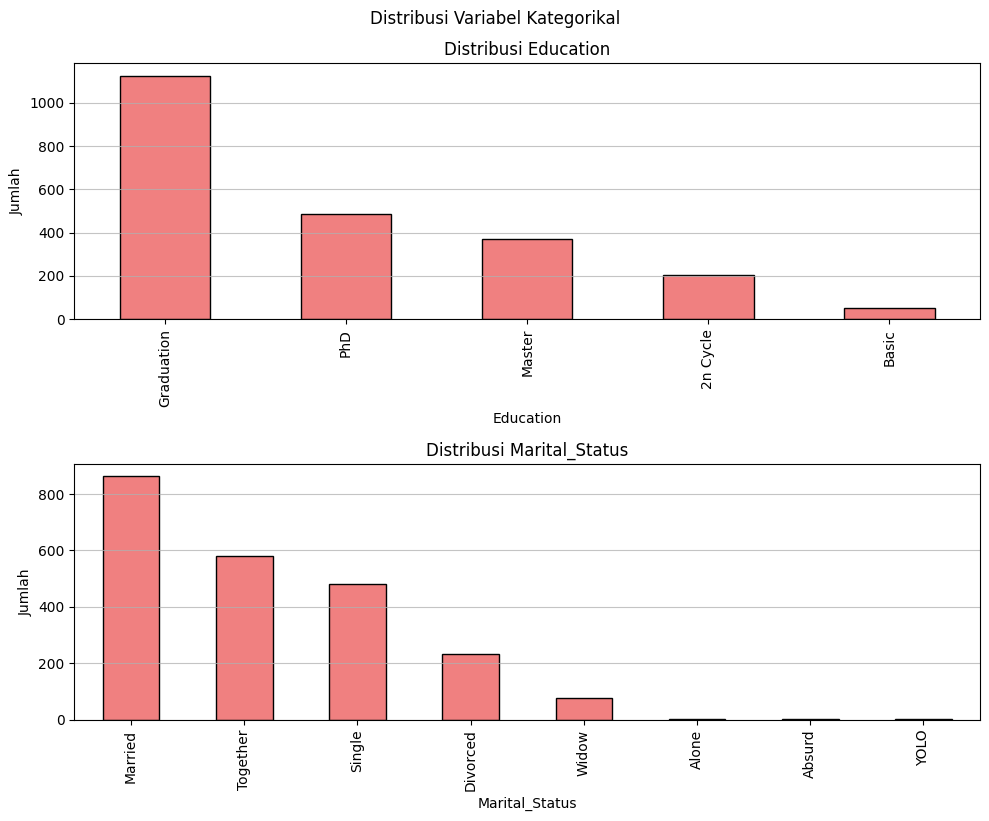

In [43]:
# Visualisasi diagram batang untuk variabel kategorikal
plt.figure(figsize=(10, len(categorical_columns) * 4))  # Mengatur ukuran gambar

for i, column in enumerate(categorical_columns):
    plt.subplot(len(categorical_columns), 1, i + 1)  # Satu per baris
    df[column].value_counts().plot(kind='bar', color='lightcoral', edgecolor='black')
    plt.title(f'Distribusi {column}')
    plt.xlabel(column)
    plt.ylabel('Jumlah')
    plt.grid(axis='y', alpha=0.75)

plt.tight_layout()  # Menyesuaikan layout agar tidak tumpang tindih
plt.suptitle('Distribusi Variabel Kategorikal', y=1.02)
plt.show()

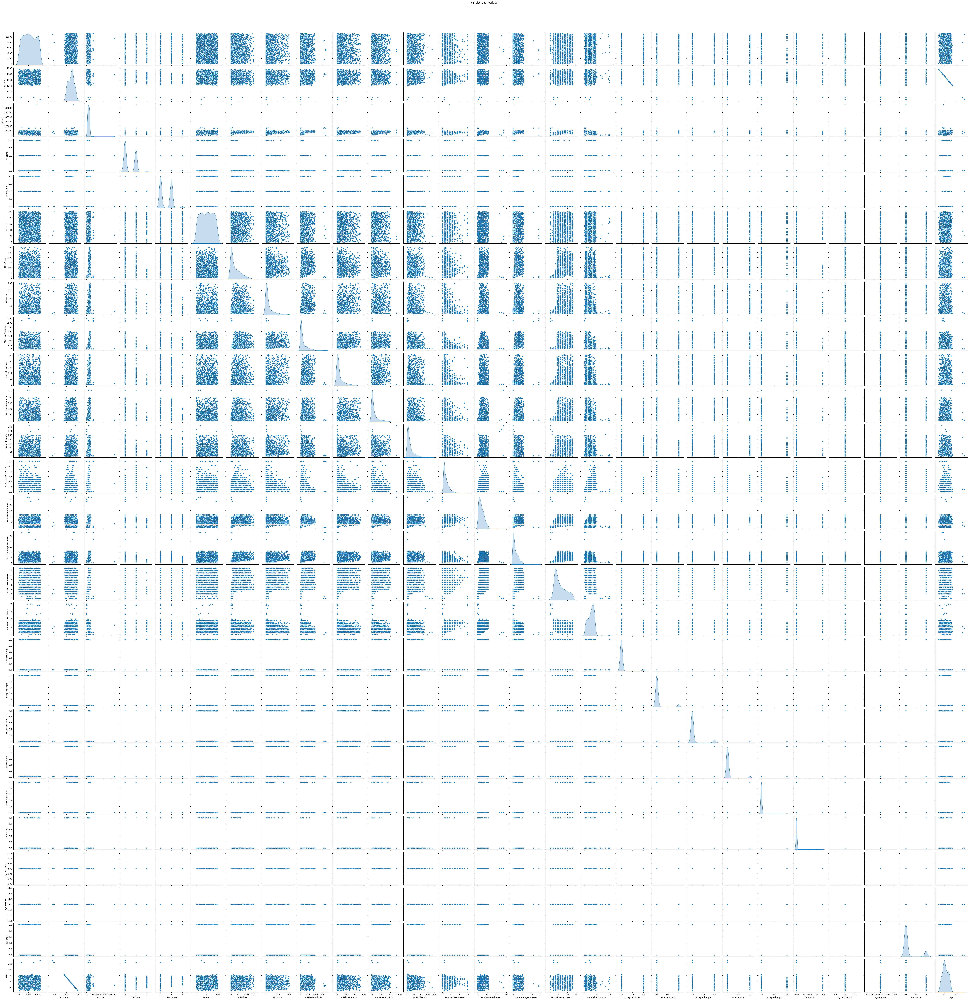

In [ ]:
# Visualisasi scatter plot antar variabel
sns.pairplot(df[numerical_columns], diag_kind='kde')
plt.suptitle('Pairplot Antar Variabel', y=1.02)
plt.show()


In [44]:
df['Marital_Status'] = df["Marital_Status"].replace({"Married":"Partner", "Together":"Partner", "Absurd":"Alone",
    "Widow":"Alone", "YOLO":"Alone", "Divorced":"Alone", "Single":"Alone"})

step_2 = df['Marital_Status'].replace({'Alone': 1, 'Partner': 2})

df["Family_Size"] = step_2 + df['Kidhome'] + df['Teenhome']

df = pd.concat([df, pd.get_dummies(df['Marital_Status'])], axis=1)


<ipython-input-44-92c29a97e72d>:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  step_2 = df['Marital_Status'].replace({'Alone': 1, 'Partner': 2})


In [45]:
mnt_cols = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
df['Sum_Mnt'] = df[mnt_cols].sum(axis=1)

In [46]:
accepted_cmp_cols = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
                     'Response']
df['Num_Accepted_Cmp'] = df[accepted_cmp_cols].sum(axis=1)


In [47]:
total_purchases = ['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']
df['Num_Total_Purchases'] = df[total_purchases].sum(axis=1)

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 37 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   float64       
 1   Year_Birth           2240 non-null   float64       
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2240 non-null   float64       
 5   Kidhome              2240 non-null   float64       
 6   Teenhome             2240 non-null   float64       
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   float64       
 9   MntWines             2240 non-null   float64       
 10  MntFruits            2240 non-null   float64       
 11  MntMeatProducts      2240 non-null   float64       
 12  MntFishProducts      2240 non-null   float64       
 13  MntSweetProducts     2240 non-nul

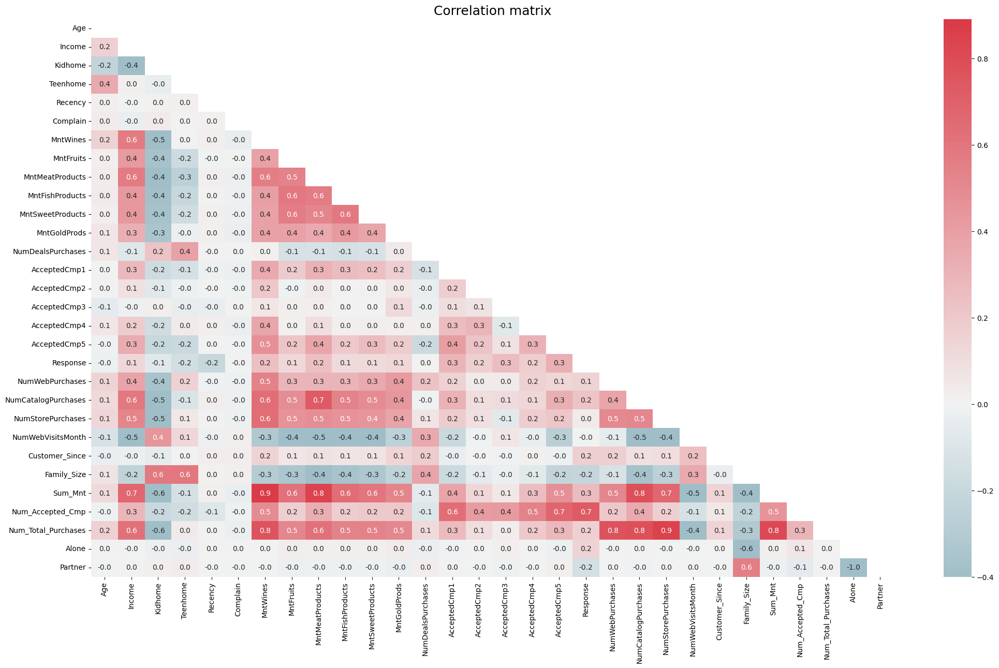

In [49]:
to_corr = ['Age', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Complain',
          'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
          'MntGoldProds', 'NumDealsPurchases', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3',
          'AcceptedCmp4', 'AcceptedCmp5', 'Response', 'NumWebPurchases', 'NumCatalogPurchases',
          'NumStorePurchases', 'NumWebVisitsMonth', 'Customer_Since', 'Family_Size',
           'Sum_Mnt', 'Num_Accepted_Cmp', 'Num_Total_Purchases', 'Alone', 'Partner']

cmap = sns.diverging_palette(220, 10, as_cmap=True)
matrix = np.triu(df[to_corr].corr())
plt.figure(figsize=(25, 14))
plt.title('Correlation matrix', fontsize=18)
sns.heatmap(df[to_corr].corr(), annot=True,
            fmt='.1f', vmin=-0.4, center=0, cmap=cmap, mask=matrix)

plt.show()

Visualisasi ini adalah grafik kolerasi setelah ditambahkan beberapa features



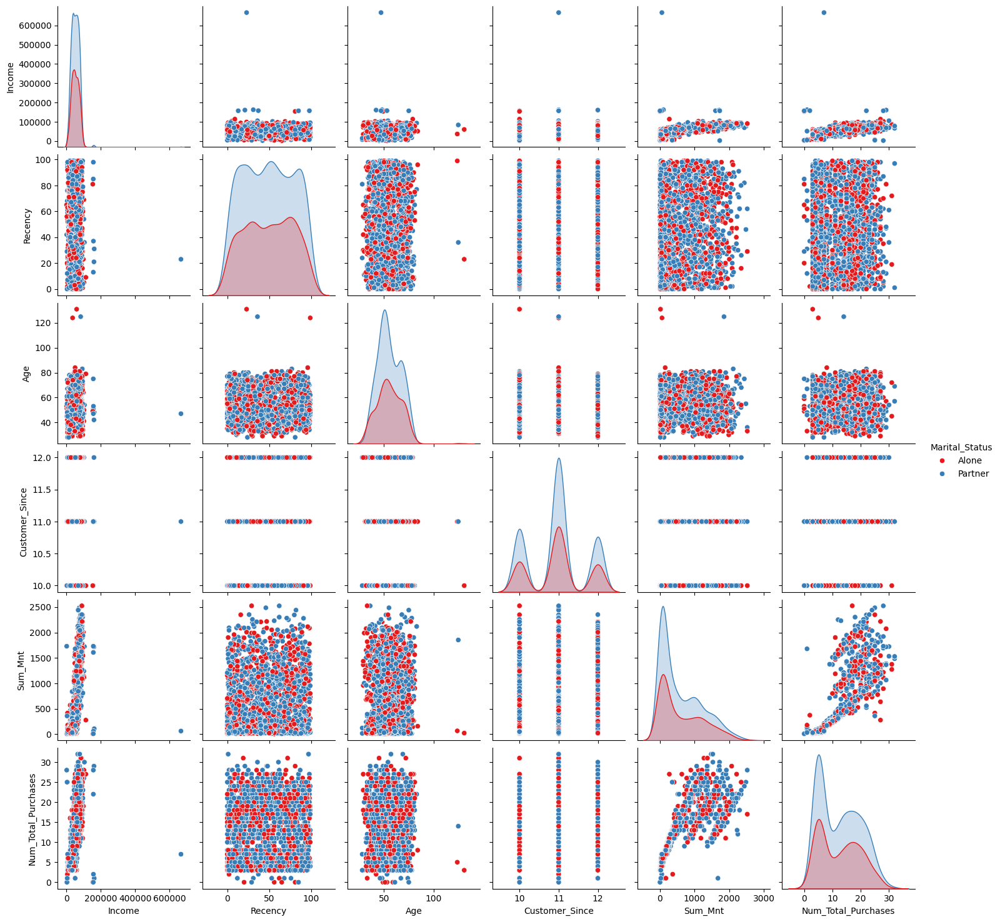

In [50]:
to_plot = ['Income', 'Recency', 'Age', 'Customer_Since', 'Sum_Mnt',
           'Num_Total_Purchases', 'Marital_Status','Education']
sns.pairplot(df[to_plot], hue='Marital_Status', palette='Set1')
plt.show()


# **5. Data Preprocessing**

Pada tahap ini, data preprocessing adalah langkah penting untuk memastikan kualitas data sebelum digunakan dalam model machine learning. Data mentah sering kali mengandung nilai kosong, duplikasi, atau rentang nilai yang tidak konsisten, yang dapat memengaruhi kinerja model. Oleh karena itu, proses ini bertujuan untuk membersihkan dan mempersiapkan data agar analisis berjalan optimal.

Berikut adalah tahapan-tahapan yang perlu dilakukan, namun **tidak terbatas** pada:
1. Menghapus atau Menangani Data Kosong (Missing Values)
2. Menghapus Data Duplikat
3. Normalisasi atau Standarisasi Fitur
4. Deteksi dan Penanganan Outlier
5. Encoding Data Kategorikal
6. Binning (Pengelompokan Data)

1. Menghapus atau Menangani Data Kosong (Sudah dilakukan pada tahap EDA)
2. Menghapus data duplikat

In [51]:
#Menghapus duplikat
df.drop_duplicates(inplace=True)

In [52]:
#Tinjau jumlah baris dan kolom dalam dataset
print("Jumlah baris dan kolom:", df.shape)

Jumlah baris dan kolom: (2240, 37)


In [53]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 37 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   float64       
 1   Year_Birth           2240 non-null   float64       
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2240 non-null   float64       
 5   Kidhome              2240 non-null   float64       
 6   Teenhome             2240 non-null   float64       
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   float64       
 9   MntWines             2240 non-null   float64       
 10  MntFruits            2240 non-null   float64       
 11  MntMeatProducts      2240 non-null   float64       
 12  MntFishProducts      2240 non-null   float64       
 13  MntSweetProducts     2240 non-nul

3. Normalisasi dan Standarisasi

In [55]:
# Pilih kolom kategorikal (bertipe object) dan kolom numerik (float dan integer)
categorical_features = df.select_dtypes(include=['object','bool']).columns.tolist()
numeric_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Menghapus kolom 'ID' dari kolom numerik, jika ada
numeric_features = [col for col in numeric_features if col != 'ID']

# Menyusun data baru yang terdiri dari kategori dan numerik
selected_features = categorical_features + numeric_features

# Tampilkan data dengan kolom yang dipilih
df_selected = df[selected_features]

# Normalisasi kolom numerik menggunakan MinMaxScaler
scaler_minmax = MinMaxScaler()
df_normalized = df_selected.copy()  # Salin data asli untuk normalisasi
df_normalized[numeric_features] = scaler_minmax.fit_transform(df_selected[numeric_features])

# Standarisasi kolom numerik menggunakan StandardScaler
scaler_standard = StandardScaler()
df_standardized = df_selected.copy()  # Salin data asli untuk standarisasi
df_standardized[numeric_features] = scaler_standard.fit_transform(df_selected[numeric_features])

# Menampilkan hasil awal normalisasi dan standarisasi pada kolom numerik
print("Data Normalized (MinMaxScaler):")
print(df_normalized.head())

print("\nData Standardized (StandardScaler):")
print(df_standardized.head())

Data Normalized (MinMaxScaler):
    Education Marital_Status  Alone  Partner  Year_Birth    Income  Kidhome  \
0  Graduation          Alone   True    False    0.621359  0.084832      0.0   
1  Graduation          Alone   True    False    0.592233  0.067095      0.5   
2  Graduation        Partner  False     True    0.699029  0.105097      0.0   
3  Graduation        Partner  False     True    0.883495  0.037471      0.5   
4         PhD        Partner  False     True    0.854369  0.085065      0.5   

   Teenhome   Recency  MntWines  ...  Complain  Z_CostContact  Z_Revenue  \
0       0.0  0.585859  0.425318  ...       0.0            0.0        0.0   
1       0.5  0.383838  0.007368  ...       0.0            0.0        0.0   
2       0.0  0.262626  0.285332  ...       0.0            0.0        0.0   
3       0.0  0.262626  0.007368  ...       0.0            0.0        0.0   
4       0.0  0.949495  0.115874  ...       0.0            0.0        0.0   

   Response       Age  Customer_Sinc

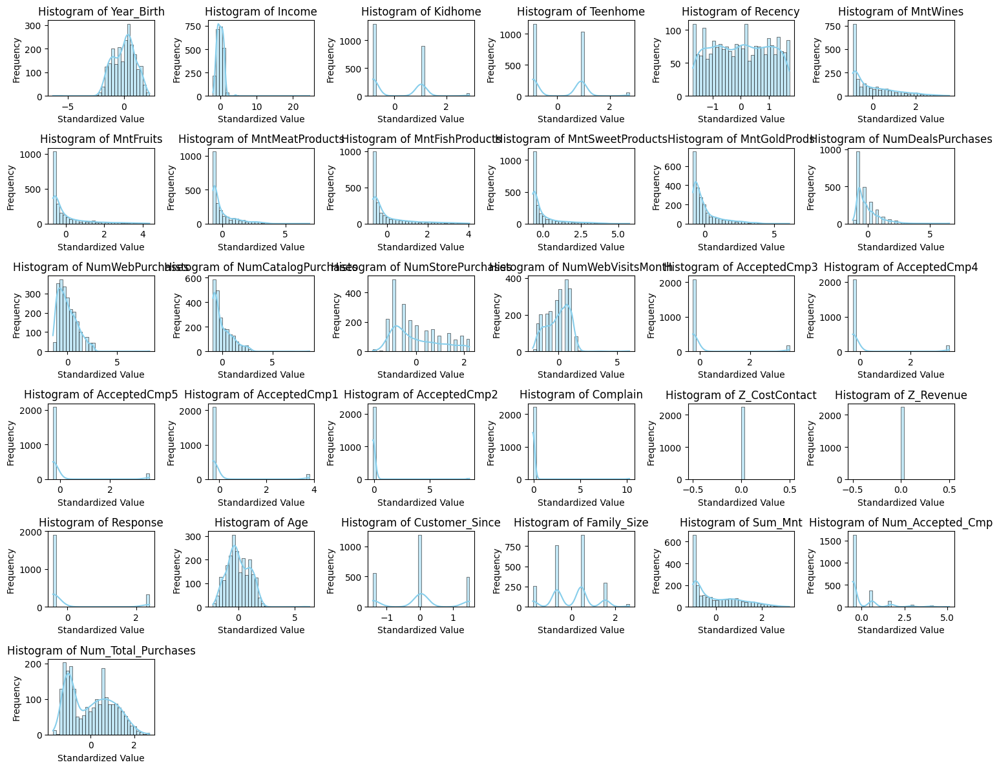

In [ ]:
# Membuat histogram untuk setiap fitur yang sudah distandarisasi
plt.figure(figsize=(15, 12))
for i, col in enumerate(numeric_features, 1):
    plt.subplot(6, 6, i)  # Menyesuaikan jumlah subplot berdasarkan jumlah fitur
    sns.histplot(df_standardized[col], kde=True, bins=30, color='skyblue')
    plt.title(f"Histogram of {col}")
    plt.xlabel("Standardized Value")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

4. Deteksi dan Penanganan Outlier

In [56]:
df.isna().sum()

,0
ID,0
Year_Birth,0
Education,0
Marital_Status,0
Income,0
Kidhome,0
Teenhome,0
Dt_Customer,0
Recency,0
MntWines,0


In [113]:
#Menghapus Outlier
def remove_outliers(data: pd.DataFrame, column: str):
    q3, q1 = np.nanpercentile(data[column], [75, 25])
    iqr = q3 - q1
    upper_bound = q3 + 1.5 * iqr
    lower_bound = q1 - 1.5 * iqr
    data = data[(data[column] > lower_bound) & (data[column] < upper_bound)]

    return data

df = remove_outliers(df, 'Age')
df = remove_outliers(df, 'Income')
df = remove_outliers(df, 'Num_Total_Purchases')

In [58]:
df.drop(['Year_Birth', 'ID',
         'Z_CostContact', 'Z_Revenue',
         'Marital_Status'], axis=1, inplace=True)

5. Encoding Data Kategorikal

In [60]:
df["Education"] = df["Education"].replace({"Basic": 0, "Graduation": 1, "2n Cycle": 2, "Master": 2, "PhD": 3})

<ipython-input-60-33c12099d8bd>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["Education"] = df["Education"].replace({"Basic": 0, "Graduation": 1, "2n Cycle": 2, "Master": 2, "PhD": 3})


In [62]:
# Memisahkan kolom numerik dan kategorikal
numeric_cols = df.select_dtypes(include=['float64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object','bool']).columns.tolist()


In [63]:
df_one_hot = pd.get_dummies(df, columns=categorical_cols)
df_one_hot

,Education,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,Age,Customer_Since,Family_Size,Sum_Mnt,Num_Accepted_Cmp,Num_Total_Purchases,Alone_False,Alone_True,Partner_False,Partner_True
0,1,58138.0,0.0,0.0,2012-09-04,58.0,635.0,88.0,546.0,172.0,...,67.0,12.0,1.0,1617.0,1.0,22.0,False,True,True,False
1,1,46344.0,1.0,1.0,2014-03-08,38.0,11.0,1.0,6.0,2.0,...,70.0,10.0,3.0,27.0,0.0,4.0,False,True,True,False
2,1,71613.0,0.0,0.0,2013-08-21,26.0,426.0,49.0,127.0,111.0,...,59.0,11.0,2.0,776.0,0.0,20.0,True,False,False,True
3,1,26646.0,1.0,0.0,2014-02-10,26.0,11.0,4.0,20.0,10.0,...,40.0,10.0,3.0,53.0,0.0,6.0,True,False,False,True
4,3,58293.0,1.0,0.0,2014-01-19,94.0,173.0,43.0,118.0,46.0,...,43.0,10.0,3.0,422.0,0.0,14.0,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1,61223.0,0.0,1.0,2013-06-13,46.0,709.0,43.0,182.0,42.0,...,57.0,11.0,3.0,1341.0,0.0,16.0,True,False,False,True
2236,3,64014.0,2.0,1.0,2014-06-10,56.0,406.0,0.0,30.0,0.0,...,78.0,10.0,5.0,444.0,1.0,15.0,True,False,False,True
2237,1,56981.0,0.0,0.0,2014-01-25,91.0,908.0,48.0,217.0,32.0,...,43.0,10.0,1.0,1241.0,1.0,18.0,False,True,True,False
2238,2,69245.0,0.0,1.0,2014-01-24,8.0,428.0,30.0,214.0,80.0,...,68.0,10.0,3.0,843.0,0.0,21.0,True,False,False,True


5. Binning berdasarkan income


In [64]:
# Tentukan batas untuk bin sesuai rentang 0-100000 pada 'Income'
bins_income = [0, 20000, 40000, 60000, 80000, 100000]
labels_income = ['Very Low', 'Low', 'Medium', 'High', 'Very High']

# Lakukan binning untuk 'Income'
df['Income_Binned'] = pd.cut(df['Income'], bins=bins_income, labels=labels_income, right=False)

# Tampilkan hasil binning
print(df[['Income', 'Income_Binned']].head())


    Income Income_Binned
0  58138.0        Medium
1  46344.0        Medium
2  71613.0          High
3  26646.0           Low
4  58293.0        Medium


# **6. Pembangunan Model Clustering**

## **a. Pembangunan Model Clustering**

Pada tahap ini, Anda membangun model clustering dengan memilih algoritma yang sesuai untuk mengelompokkan data berdasarkan kesamaan. Berikut adalah **rekomendasi** tahapannya.
1. Pilih algoritma clustering yang sesuai.
2. Latih model dengan data menggunakan algoritma tersebut.

## **b. Evaluasi Model Clustering**

Untuk menentukan jumlah cluster yang optimal dalam model clustering, Anda dapat menggunakan metode Elbow atau Silhouette Score.

Metode ini membantu kita menemukan jumlah cluster yang memberikan pemisahan terbaik antar kelompok data, sehingga model yang dibangun dapat lebih efektif. Berikut adalah **rekomendasi** tahapannya.
1. Gunakan Silhouette Score dan Elbow Method untuk menentukan jumlah cluster optimal.
2. Hitung Silhouette Score sebagai ukuran kualitas cluster.

In [67]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2229 entries, 0 to 2239
Data columns (total 33 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Education            2229 non-null   int64         
 1   Income               2229 non-null   float64       
 2   Kidhome              2229 non-null   float64       
 3   Teenhome             2229 non-null   float64       
 4   Dt_Customer          2229 non-null   datetime64[ns]
 5   Recency              2229 non-null   float64       
 6   MntWines             2229 non-null   float64       
 7   MntFruits            2229 non-null   float64       
 8   MntMeatProducts      2229 non-null   float64       
 9   MntFishProducts      2229 non-null   float64       
 10  MntSweetProducts     2229 non-null   float64       
 11  MntGoldProds         2229 non-null   float64       
 12  NumDealsPurchases    2229 non-null   float64       
 13  NumWebPurchases      2229 non-null   f

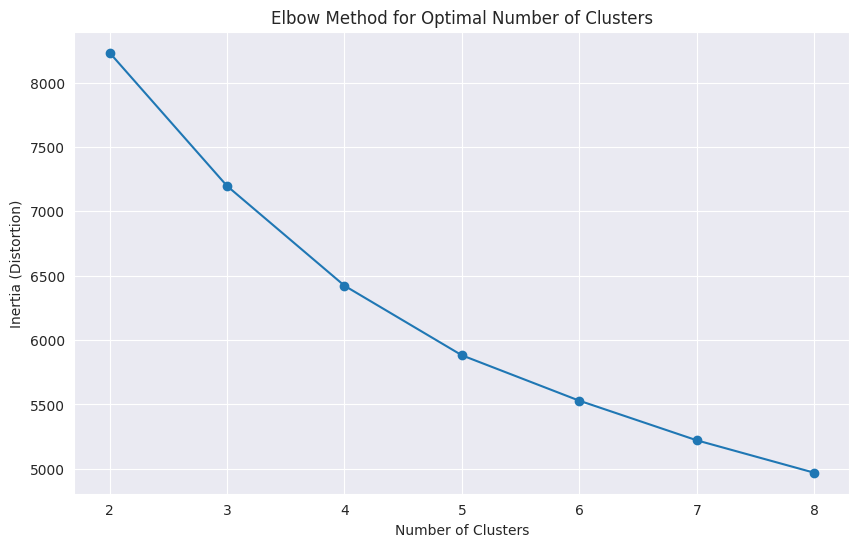

Silhouette Score untuk 3 clusters: 0.1695415482143254
   Cluster   Income   Age  Recency  Education  Alone  Partner Income_Binned
0        1  58138.0  67.0     58.0          1   True    False        Medium
1        1  46344.0  70.0     38.0          1   True    False        Medium
2        2  71613.0  59.0     26.0          1  False     True          High
3        0  26646.0  40.0     26.0          1  False     True           Low
4        2  58293.0  43.0     94.0          3  False     True        Medium


In [68]:
# Memilih kolom kategorikal
categorical_features = ['Education', 'Alone','Partner','Income_Binned']
numeric_features = ['Income', 'Age', 'Recency']

# One-hot encode kolom kategorikal
encoder = OneHotEncoder(drop='first', sparse_output=False)  # Gunakan sparse_output
categorical_encoded = encoder.fit_transform(df[categorical_features])
categorical_encoded_df = pd.DataFrame(categorical_encoded, columns=encoder.get_feature_names_out(categorical_features))

# Standarisasi kolom numerik
scaler = StandardScaler()
numeric_standardized = scaler.fit_transform(df[numeric_features])
df_standardized = pd.DataFrame(numeric_standardized, columns=numeric_features)

# Gabungkan kolom numerik yang sudah distandarisasi dan kolom kategorikal yang diencode
df_combined = pd.concat([df_standardized, categorical_encoded_df], axis=1)

# Menentukan jumlah cluster optimal menggunakan Elbow Method
kmeans_inertia = []
range_n_clusters = range(2, 9)  # Jumlah cluster dari 2 hingga 8

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(df_combined)
    kmeans_inertia.append(kmeans.inertia_)

# Visualisasi Elbow Method
plt.figure(figsize=(10, 6))
sns.set_style("darkgrid")
plt.plot(range_n_clusters, kmeans_inertia, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Distortion)')
plt.show()

# Menggunakan jumlah cluster optimal, misalnya n_clusters=3 (sesuai hasil Elbow Method)
optimal_clusters = 3
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(df_combined)

# Evaluasi dengan Silhouette Score
silhouette_avg = silhouette_score(df_combined, kmeans_labels)
print(f"Silhouette Score untuk {optimal_clusters} clusters: {silhouette_avg}")

# Menambahkan label cluster ke dataframe asli
df['Cluster'] = kmeans_labels
print(df[['Cluster'] + numeric_features + categorical_features].head())

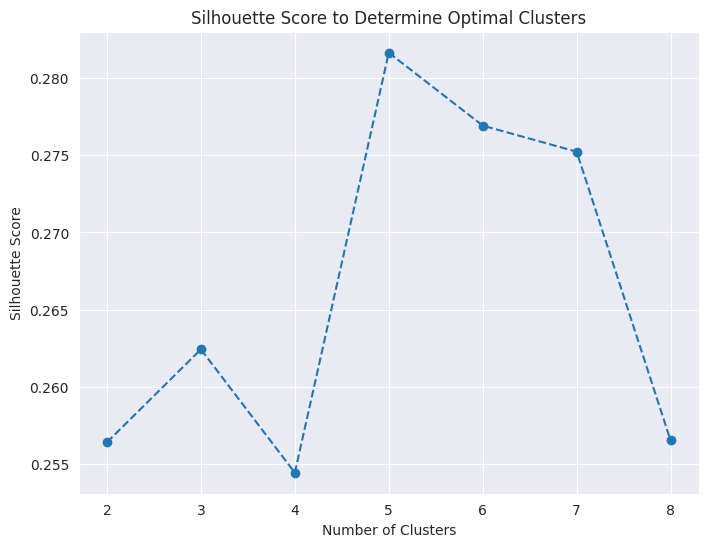

In [69]:
# Inisialisasi list untuk menyimpan silhouette scores
silhouette_scores = []
range_n_clusters = range(2, 9)  # Jumlah cluster dari 2 hingga 8

# Hitung silhouette scores untuk setiap jumlah cluster
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(df_standardized[numeric_features])
    silhouette_avg = silhouette_score(df_standardized[numeric_features], kmeans_labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Score to Determine Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(range_n_clusters)  # Menampilkan tick pada sumbu X
plt.grid(True)
plt.show()

In [70]:
# Evaluasi dengan Silhouette Score
silhouette_avg = silhouette_score(df_standardized[numeric_features], kmeans_labels)
print(f"Silhouette Score untuk {optimal_clusters} clusters: {silhouette_avg}")

Silhouette Score untuk 3 clusters: 0.2565384625758725


Karena model clustering menghasilkan nilai yang sangat rendah maka akan dilakukan feature selection

## **c. Feature Selection (Opsional)**

Silakan lakukan feature selection jika Anda membutuhkan optimasi model clustering. Jika Anda menerapkan proses ini, silakan lakukan pemodelan dan evaluasi kembali menggunakan kolom-kolom hasil feature selection. Terakhir, bandingkan hasil performa model sebelum dan sesudah menerapkan feature selection.

In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2229 entries, 0 to 2239
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Education            2229 non-null   int64         
 1   Income               2229 non-null   float64       
 2   Kidhome              2229 non-null   float64       
 3   Teenhome             2229 non-null   float64       
 4   Dt_Customer          2229 non-null   datetime64[ns]
 5   Recency              2229 non-null   float64       
 6   MntWines             2229 non-null   float64       
 7   MntFruits            2229 non-null   float64       
 8   MntMeatProducts      2229 non-null   float64       
 9   MntFishProducts      2229 non-null   float64       
 10  MntSweetProducts     2229 non-null   float64       
 11  MntGoldProds         2229 non-null   float64       
 12  NumDealsPurchases    2229 non-null   float64       
 13  NumWebPurchases      2229 non-null   f

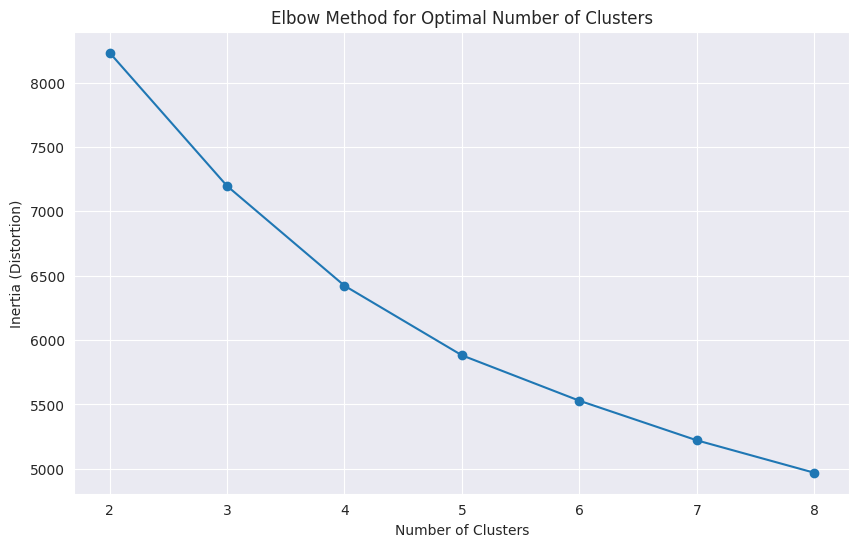

Silhouette Score untuk 3 clusters: 0.1695415482143254
   Cluster   Income   Age  Recency  Education  Alone  Partner Income_Binned
0        1  58138.0  67.0     58.0          1   True    False        Medium
1        1  46344.0  70.0     38.0          1   True    False        Medium
2        2  71613.0  59.0     26.0          1  False     True          High
3        0  26646.0  40.0     26.0          1  False     True           Low
4        2  58293.0  43.0     94.0          3  False     True        Medium


In [74]:
# Memilih kolom kategorikal
categorical_features = ['Education', 'Alone','Partner','Income_Binned']
numeric_features = ['Income', 'Age', 'Recency']

# One-hot encode kolom kategorikal
encoder = OneHotEncoder(drop='first', sparse_output=False)  # Gunakan sparse_output
categorical_encoded = encoder.fit_transform(df[categorical_features])
categorical_encoded_df = pd.DataFrame(categorical_encoded, columns=encoder.get_feature_names_out(categorical_features))

# Standarisasi kolom numerik
scaler = StandardScaler()
numeric_standardized = scaler.fit_transform(df[numeric_features])
df_standardized = pd.DataFrame(numeric_standardized, columns=numeric_features)

# Gabungkan kolom numerik yang sudah distandarisasi dan kolom kategorikal yang diencode
df_combined = pd.concat([df_standardized, categorical_encoded_df], axis=1)

# Menentukan jumlah cluster optimal menggunakan Elbow Method
kmeans_inertia = []
range_n_clusters = range(2, 9)  # Jumlah cluster dari 2 hingga 8

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(df_combined)
    kmeans_inertia.append(kmeans.inertia_)

# Visualisasi Elbow Method
plt.figure(figsize=(10, 6))
sns.set_style("darkgrid")
plt.plot(range_n_clusters, kmeans_inertia, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Distortion)')
plt.show()

# Menggunakan jumlah cluster optimal, misalnya n_clusters=3 (sesuai hasil Elbow Method)
optimal_clusters = 3
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(df_combined)

# Evaluasi dengan Silhouette Score
silhouette_avg = silhouette_score(df_combined, kmeans_labels)
print(f"Silhouette Score untuk {optimal_clusters} clusters: {silhouette_avg}")

# Menambahkan label cluster ke dataframe asli
df['Cluster'] = kmeans_labels
print(df[['Cluster'] + numeric_features + categorical_features].head())

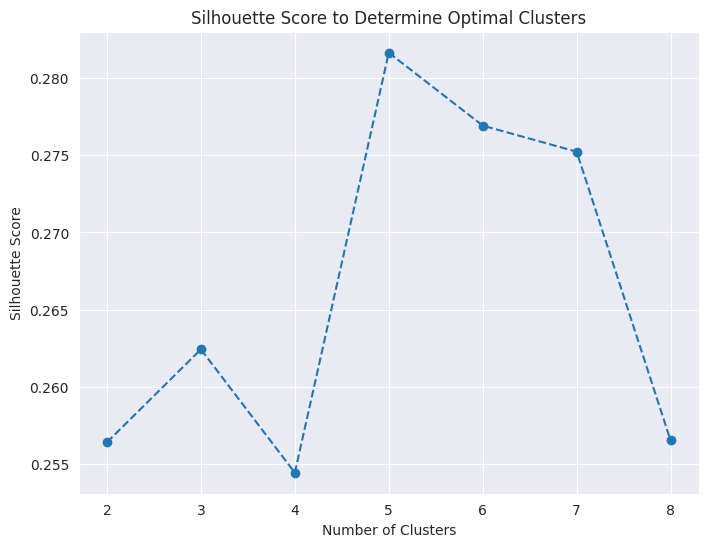

In [75]:
# Inisialisasi list untuk menyimpan silhouette scores
silhouette_scores = []
range_n_clusters = range(2, 9)  # Jumlah cluster dari 2 hingga 8

# Hitung silhouette scores untuk setiap jumlah cluster
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(df_standardized[numeric_features])
    silhouette_avg = silhouette_score(df_standardized[numeric_features], kmeans_labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores
plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Score to Determine Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(range_n_clusters)  # Menampilkan tick pada sumbu X
plt.grid(True)
plt.show()

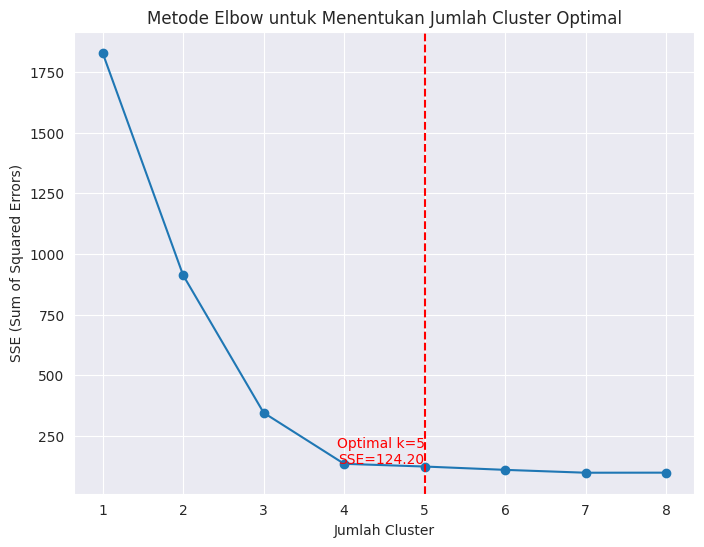

Jumlah cluster optimal (k) adalah 5.
Nilai SSE pada k=5 adalah 124.20.


In [76]:
# Membuat dataset buatan
X, y = make_blobs(n_samples=200, centers=4, cluster_std=0.60, random_state=0)

# Menentukan rentang jumlah cluster yang akan diuji
range_n_clusters = range(1, 9)

# Menyimpan hasil SSE untuk setiap jumlah cluster
sse = []

# Menghitung SSE untuk setiap jumlah cluster
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(X)
    sse.append(kmeans.inertia_)

# Menentukan titik elbow terbaik
# Menghitung perubahan pada SSE
slope_changes = np.diff(sse, 2)  # Menghitung perubahan kedua pada SSE
optimal_k = np.argmin(slope_changes) + 2  # +2 karena np.diff mengurangi panjang array

# Membuat plot untuk menentukan titik elbow
plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, sse, marker='o')
plt.xlabel('Jumlah Cluster')
plt.ylabel('SSE (Sum of Squared Errors)')
plt.title('Metode Elbow untuk Menentukan Jumlah Cluster Optimal')
plt.grid(True)

# Menandai titik elbow pada plot
plt.axvline(x=optimal_k, color='r', linestyle='--')
plt.text(optimal_k, sse[optimal_k-1], f'Optimal k={optimal_k}\nSSE={sse[optimal_k-1]:.2f}',
         horizontalalignment='right', verticalalignment='bottom', color='r')

plt.show()

# Menampilkan hasil
print(f'Jumlah cluster optimal (k) adalah {optimal_k}.')
print(f'Nilai SSE pada k={optimal_k} adalah {sse[optimal_k-1]:.2f}.')

In [ ]:
# Standarisasi data
data_scaled = StandardScaler().fit_transform(df[numeric_features])
#Pilih 5 Fitur Terbaik dengan PCA
pca = PCA(n_components=5)  # Pilih 5 komponen utama
data_selected = pca.fit_transform(data_scaled)  # Data terpilih

print(f"Bentuk data setelah PCA: {data_selected.shape}")


Bentuk data setelah PCA: (2229, 5)


In [78]:
# Memeriksa kolom yang ada dalam DataFrame
print("Kolom numerik:", numeric_features)
print("Kolom kategorikal:", categorical_features)

# One-hot encoding untuk fitur kategorikal
encoder = OneHotEncoder(drop='first', sparse_output=False)  # Ganti 'sparse' dengan 'sparse_output'
categorical_encoded = encoder.fit_transform(df[categorical_features])
categorical_encoded_df = pd.DataFrame(categorical_encoded, columns=encoder.get_feature_names_out(categorical_features))

# Standarisasi fitur numerik
scaler = StandardScaler()
numeric_scaled = scaler.fit_transform(df[numeric_features])
numeric_scaled_df = pd.DataFrame(numeric_scaled, columns=numeric_features)

# Gabungkan fitur numerik yang sudah distandarisasi dan fitur kategorikal yang sudah di one-hot encode
df_combined = pd.concat([numeric_scaled_df, categorical_encoded_df], axis=1)

# Pilih 5 komponen utama menggunakan PCA
pca = PCA(n_components=5)
data_selected = pca.fit_transform(df_combined)

# Tampilkan bentuk data setelah PCA
print(f"Bentuk data setelah PCA: {data_selected.shape}")

Kolom numerik: ['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Customer_Since', 'Family_Size', 'Sum_Mnt', 'Num_Accepted_Cmp', 'Num_Total_Purchases']
Kolom kategorikal: ['Alone', 'Partner', 'Income_Binned']
Bentuk data setelah PCA: (2229, 5)


In [85]:
# Cek jumlah dan nama fitur numerik
print(f"Jumlah fitur numerik yang digunakan: {len(numeric_features)}")
print(f"Nama fitur numerik: {numeric_features}")

# Cek jumlah dan nama fitur kategorikal
print(f"Jumlah fitur kategorikal yang digunakan: {len(categorical_features)}")
print(f"Nama fitur kategorikal: {categorical_features}")


Jumlah fitur numerik yang digunakan: 29
Nama fitur numerik: ['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Customer_Since', 'Family_Size', 'Sum_Mnt', 'Num_Accepted_Cmp', 'Num_Total_Purchases']
Jumlah fitur kategorikal yang digunakan: 3
Nama fitur kategorikal: ['Alone', 'Partner', 'Income_Binned']


In [106]:
selected_features = [
    'Income',        # Fitur numerik
    'Num_Total_Purchases',      # Fitur numerik
    'Education',       # Fitur kategorikal
]

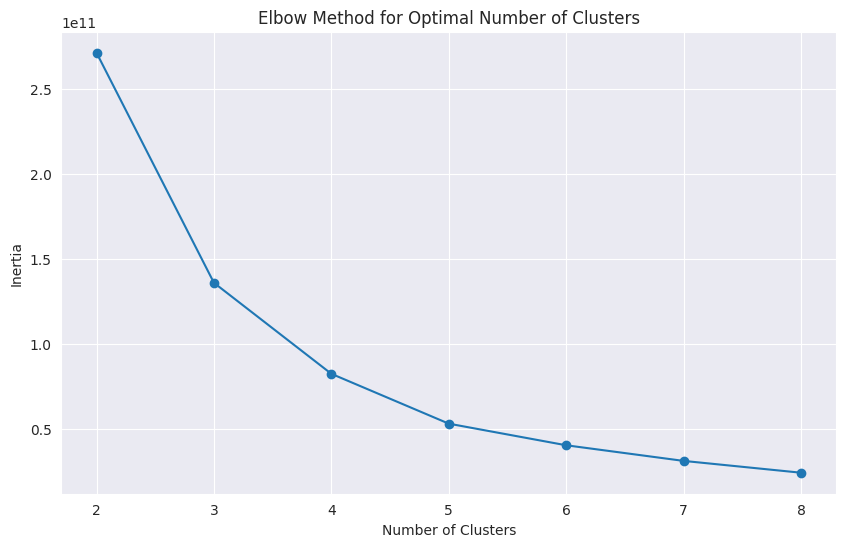

Silhouette Score untuk 3 clusters: 0.5533068163724671
   Cluster   Income  Num_Total_Purchases  Education
0        2  58138.0                 22.0          1
1        2  46344.0                  4.0          1
2        1  71613.0                 20.0          1
3        0  26646.0                  6.0          1
4        2  58293.0                 14.0          3


In [114]:
# Memeriksa apakah semua fitur terpilih ada di DataFrame
missing_features = [feature for feature in selected_features if feature not in df.columns]
if missing_features:
    print(f"Fitur berikut tidak ditemukan dalam DataFrame: {missing_features}")
else:
    # Mengambil subset dari DataFrame berdasarkan fitur terpilih
    data_selected_features = df[selected_features]

    # Melakukan one-hot encoding untuk fitur kategorikal
    data_selected_features_encoded = pd.get_dummies(data_selected_features, drop_first=True)

    # Melakukan standardisasi fitur numerik
    scaler = StandardScaler()
    numeric_features = ['Education', 'Num_Total_Purchases']  # Hanya fitur numerik yang relevan
    data_selected_features_encoded[numeric_features] = scaler.fit_transform(data_selected_features_encoded[numeric_features])

    # Elbow Method untuk Menentukan Jumlah Cluster Optimal
    kmeans_inertia = []
    range_n_clusters = range(2, 9)

    for n_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(data_selected_features_encoded)  # Menggunakan data dengan fitur terpilih
        kmeans_inertia.append(kmeans.inertia_)

    # Visualisasi Elbow Method
    plt.figure(figsize=(10, 6))
    sns.set_style("darkgrid")
    plt.plot(range_n_clusters, kmeans_inertia, marker='o')
    plt.title('Elbow Method for Optimal Number of Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.show()

    # Clustering dengan Jumlah Cluster Optimal
    optimal_clusters = 3
    kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(data_selected_features_encoded)

    # Evaluasi dengan Silhouette Score
    silhouette_avg = silhouette_score(data_selected_features_encoded, kmeans_labels)
    print(f"Silhouette Score untuk {optimal_clusters} clusters: {silhouette_avg}")

    # Menambahkan label cluster ke DataFrame asli
    df['Cluster'] = kmeans_labels
    print(df[['Cluster'] + selected_features].head())

Dari sini Silhoutte Score yang awalnya 0.16 nenjadai 0.55 dengan menerapkan feature selections 3 komponen utama

## **d. Visualisasi Hasil Clustering**

Setelah model clustering dilatih dan jumlah cluster optimal ditentukan, langkah selanjutnya adalah menampilkan hasil clustering melalui visualisasi.

Berikut adalah **rekomendasi** tahapannya.
1. Tampilkan hasil clustering dalam bentuk visualisasi, seperti grafik scatter plot atau 2D PCA projection.

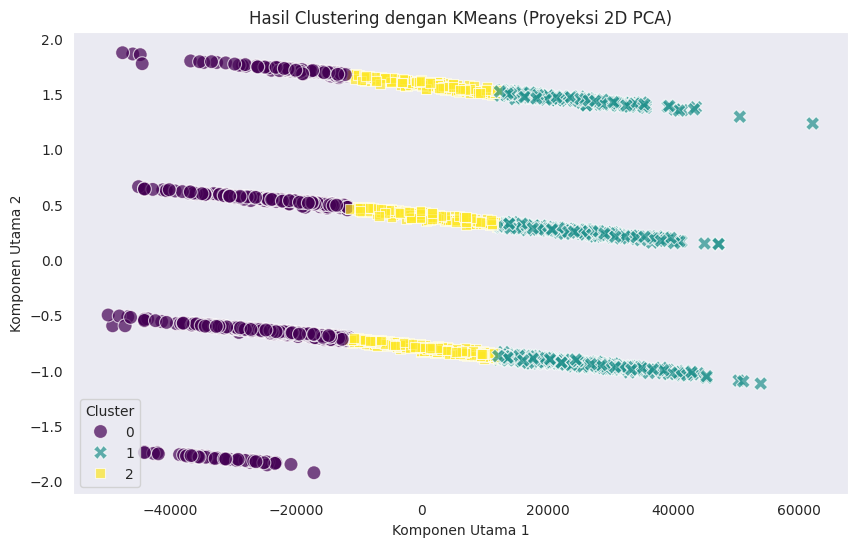

In [115]:
# Proyeksikan data ke dalam 2D menggunakan PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_selected_features_encoded)

# Buat DataFrame untuk menyimpan hasil PCA dan label cluster
pca_df = pd.DataFrame(data_pca, columns=['PC1', 'PC2'])
pca_df['Cluster'] = kmeans_labels

# Visualisasi hasil clustering
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Cluster', palette='viridis', style='Cluster', s=100, alpha=0.7)
plt.title('Hasil Clustering dengan KMeans (Proyeksi 2D PCA)')
plt.xlabel('Komponen Utama 1')
plt.ylabel('Komponen Utama 2')
plt.legend(title='Cluster')
plt.grid()
plt.show()

## **e. Analisis dan Interpretasi Hasil Cluster**

Setelah melakukan clustering, langkah selanjutnya adalah menganalisis karakteristik dari masing-masing cluster berdasarkan fitur yang tersedia.

Berikut adalah **rekomendasi** tahapannya.
1. Analisis karakteristik tiap cluster berdasarkan fitur yang tersedia (misalnya, distribusi nilai dalam cluster).
2. Berikan interpretasi: Apakah hasil clustering sesuai dengan ekspektasi dan logika bisnis? Apakah ada pola tertentu yang bisa dimanfaatkan?

In [116]:
# Menghitung statistik deskriptif untuk setiap cluster
cluster_characteristics = df.groupby('Cluster')[selected_features].describe()
print(cluster_characteristics)


        Income                                                                 \
         count          mean          std      min      25%      50%      75%   
Cluster                                                                         
0        733.0  28223.518417  8388.167912   1730.0  22634.0  29791.0  35178.0   
1        711.0  75582.925457  8252.926132  63777.0  69073.5  74854.0  80988.5   
2        785.0  51761.243312  6794.580773  40059.0  46015.0  51381.5  57420.0   

                  Num_Total_Purchases             ...             Education  \
              max               count       mean  ...   75%   max     count   
Cluster                                           ...                         
0         40049.0               733.0   5.748977  ...   7.0  28.0     733.0   
1        113734.0               711.0  19.327707  ...  22.0  32.0     711.0   
2         63693.0               785.0  12.759236  ...  17.0  29.0     785.0   

                                      

In [111]:
cluster_0 = pca_df[pca_df['Cluster'] == 0]
cluster_1 = pca_df[pca_df['Cluster'] == 1]
cluster_2 = pca_df[pca_df['Cluster'] == 2]


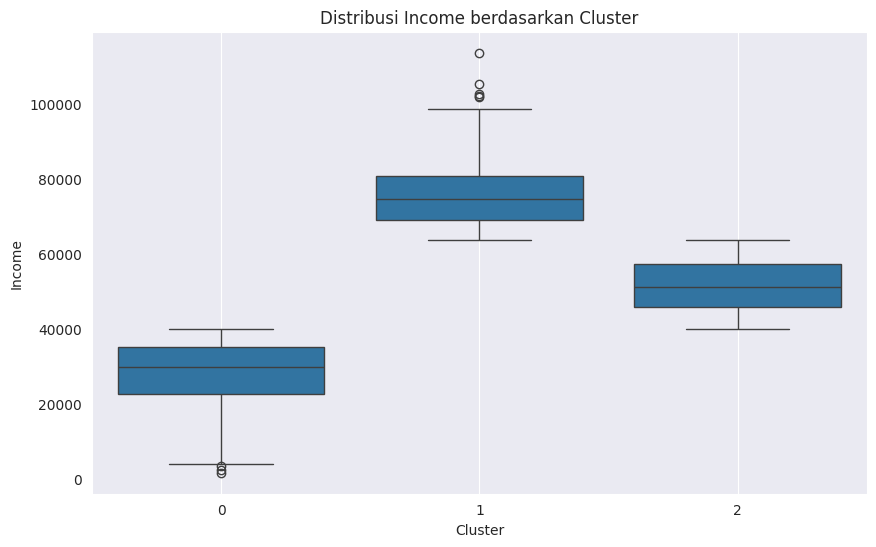

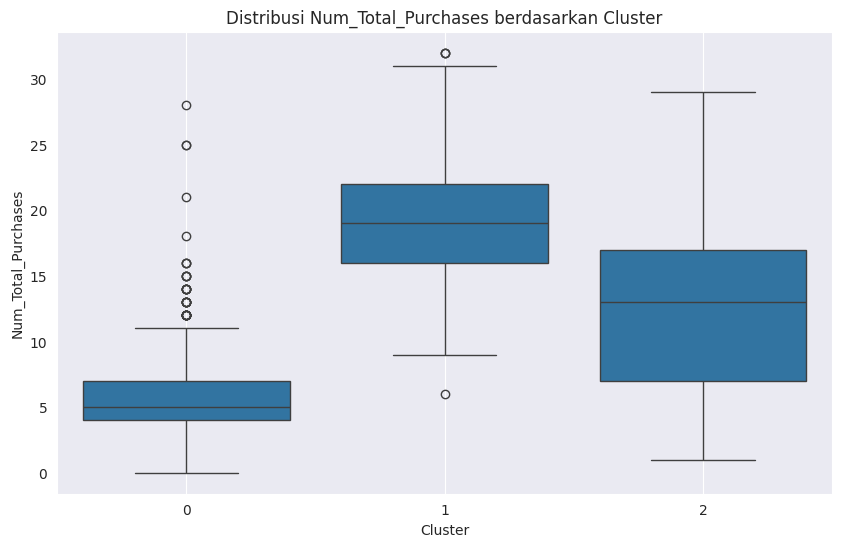

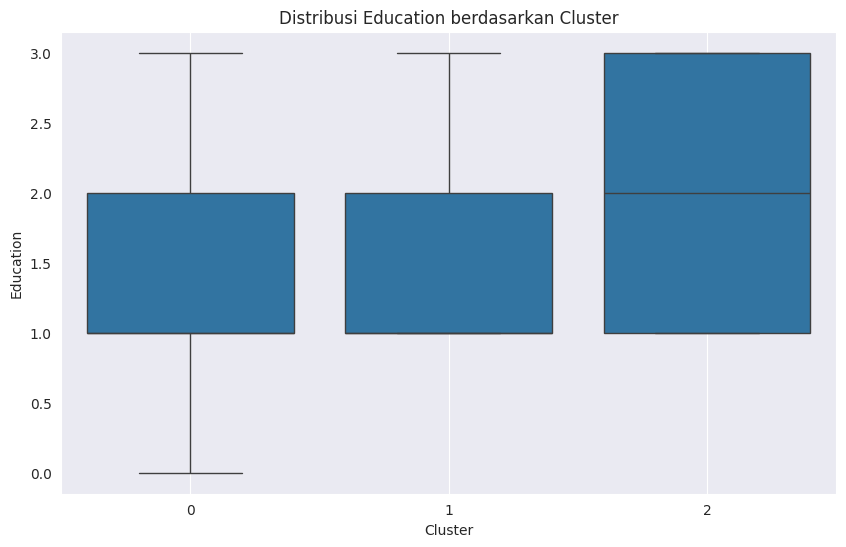

In [117]:
# Visualisasi distribusi fitur berdasarkan cluster
for feature in selected_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x='Cluster', y=feature)
    plt.title(f'Distribusi {feature} berdasarkan Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(feature)
    plt.grid()
    plt.show()

<ipython-input-129-c4fec2c817da>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='income_group', palette="viridis")
<ipython-input-129-c4fec2c817da>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Education', palette="viridis")
<ipython-input-129-c4fec2c817da>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='purchase_group', palette="viridis")


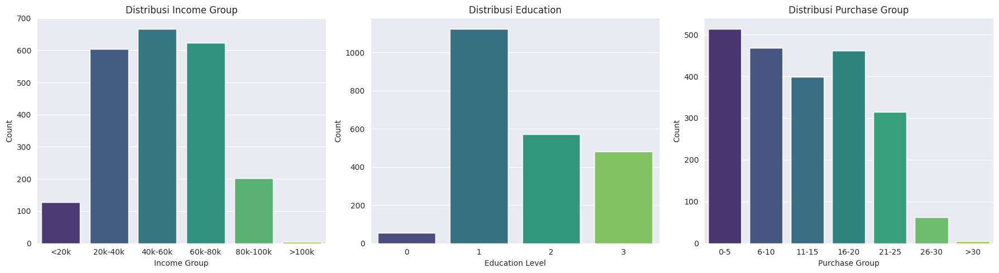

In [129]:

# Mengelompokkan 'income' dalam rentang kategori
income_bins = [0, 20000, 40000, 60000, 80000, 100000, float('inf')]
income_labels = ['<20k', '20k-40k', '40k-60k', '60k-80k', '80k-100k', '>100k']
df['income_group'] = pd.cut(df['Income'], bins=income_bins, labels=income_labels)

# Mengelompokkan 'num_total_purchases' dalam rentang kategori
purchase_bins = [0, 5, 10, 15, 20, 25, 30, float('inf')]
purchase_labels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '>30']
df['purchase_group'] = pd.cut(df['Num_Total_Purchases'], bins=purchase_bins, labels=purchase_labels)

# Visualisasi dengan kategori baru
plt.figure(figsize=(18, 5))

# Plot distribusi income group
plt.subplot(1, 3, 1)
sns.countplot(data=df, x='income_group', palette="viridis")
plt.title('Distribusi Income Group')
plt.xlabel('Income Group')
plt.ylabel('Count')

# Plot distribusi education
plt.subplot(1, 3, 2)
sns.countplot(data=df, x='Education', palette="viridis")
plt.title('Distribusi Education')
plt.xlabel('Education Level')
plt.ylabel('Count')

# Plot distribusi purchase group
plt.subplot(1, 3, 3)
sns.countplot(data=df, x='purchase_group', palette="viridis")
plt.title('Distribusi Purchase Group')
plt.xlabel('Purchase Group')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

# Analisis Karakteristik Cluster Berdasarkan Model KMeans

Berikut adalah analisis karakteristik untuk setiap cluster yang dihasilkan dari model KMeans berdasarkan variabel-variabel seperti pendapatan tahunan, skor pengeluaran, dan tingkat pendidikan.

## Cluster 0:
- **Rata-rata Pendapatan Tahunan (k$):** Lebih rendah dibandingkan Cluster 1 dan 2
- **Rata-rata Skor Pengeluaran (1-100):** Moderat
- **Tingkat Pendidikan:** Umumnya lebih rendah, dengan latar belakang pendidikan yang bervariasi.

**Analisis:**  
Cluster 0 merepresentasikan pelanggan dengan pendapatan yang relatif lebih rendah dan pengeluaran yang moderat. Latar belakang pendidikan dalam cluster ini bervariasi, yang menunjukkan bahwa pendapatan dan perilaku pengeluaran mereka mungkin dipengaruhi oleh faktor lain selain pendidikan. Pelanggan dalam cluster ini cenderung memiliki pendekatan pengeluaran yang seimbang, memilih produk atau layanan secara selektif sesuai dengan kemampuan finansial mereka.

## Cluster 1:
- **Rata-rata Pendapatan Tahunan (k$):** Menengah, namun lebih tinggi dari Cluster 0
- **Rata-rata Skor Pengeluaran (1-100):** Lebih tinggi dari Cluster 0, menunjukkan perilaku pengeluaran yang lebih aktif
- **Tingkat Pendidikan:** Mirip dengan Cluster 0, namun kebiasaan pengeluaran mereka berbeda.

**Analisis:**  
Cluster 1 mencakup pelanggan yang memiliki pendapatan lebih tinggi dibandingkan Cluster 0 dan lebih aktif dalam pengeluaran. Kelompok ini lebih nyaman secara finansial dan lebih cenderung berbelanja pada produk dan layanan tertentu. Meskipun distribusi pendidikan mereka tidak jauh berbeda, tingkat pendapatan yang lebih tinggi mungkin disebabkan oleh faktor seperti pekerjaan atau pengalaman, yang mendorong mereka untuk lebih sering berbelanja.

## Cluster 2:
- **Rata-rata Pendapatan Tahunan (k$):** Tertinggi di antara semua cluster
- **Rata-rata Skor Pengeluaran (1-100):** Rendah
- **Tingkat Pendidikan:** Tertinggi, dengan persentase individu berpendidikan lebih tinggi.

**Analisis:**  
Cluster 2 terdiri dari individu dengan pendapatan tinggi yang cenderung lebih memilih untuk menabung daripada berbelanja. Skor pengeluaran yang rendah, meskipun pendapatan tinggi, menunjukkan bahwa mereka mungkin lebih selektif dalam berbelanja, lebih memilih untuk menabung atau berinvestasi. Tingkat pendidikan yang lebih tinggi dalam cluster ini mungkin berkontribusi pada perilaku pengeluaran yang lebih hati-hati, di mana mereka lebih mengutamakan perencanaan keuangan dibandingkan konsumsi langsung.

Analisis ini memberikan pemahaman yang komprehensif tentang karakteristik unik dari setiap cluster, yang dapat membantu dalam merancang strategi pemasaran atau perencanaan keuangan yang lebih personal sesuai dengan profil setiap kelompok.
"""

# **7. Mengeksport Data**

Simpan hasilnya ke dalam file CSV.

In [130]:
# Menggabungkan label cluster ke DataFrame asli
df_with_cluster = df.copy()
df_with_cluster['Cluster'] = kmeans_labels

# Export data ke CSV
df_with_cluster.to_csv('marketing_campaign_cluster.csv', index=False)

# Unduh file CSV
files.download('marketing_campaign_cluster.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>